In [17]:
import os
import time
import glob
import random
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.models as models
import torchvision.utils as vutils
from torch.optim.lr_scheduler import CosineAnnealingLR

from skimage.metrics import peak_signal_noise_ratio, structural_similarity

class DIV2KDataset(Dataset):
    def __init__(self, root_dir, crop_size=96, scale=4, transform=None):
        """
        Args:
            root_dir (string): Directory with all the HR images.
            crop_size (int): High-resolution crop size.
            scale (int): Upscaling factor.
            transform (callable, optional): Optional transform to be applied on a sample.
        """
        self.files = sorted(glob.glob(os.path.join(root_dir, '*.png')))
        self.crop_size = crop_size
        self.scale = scale
        self.transform = transform

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        hr_image = Image.open(self.files[idx]).convert("RGB")

        # Random crop
        w, h = hr_image.size
        if w < self.crop_size or h < self.crop_size:
            hr_image = hr_image.resize((max(w, self.crop_size), max(h, self.crop_size)), Image.BICUBIC)
        left = random.randint(0, hr_image.width - self.crop_size)
        top = random.randint(0, hr_image.height - self.crop_size)
        hr_crop = hr_image.crop((left, top, left + self.crop_size, top + self.crop_size))
        
        # Create a low-resolution version using bicubic downsampling
        lr_crop = hr_crop.resize((self.crop_size // self.scale, self.crop_size // self.scale), Image.BICUBIC)
        
        # Additional augmentations: random flip and rotation
        if random.random() > 0.5:
            hr_crop = hr_crop.transpose(Image.FLIP_LEFT_RIGHT)
            lr_crop = lr_crop.transpose(Image.FLIP_LEFT_RIGHT)
        if random.random() > 0.5:
            hr_crop = hr_crop.transpose(Image.FLIP_TOP_BOTTOM)
            lr_crop = lr_crop.transpose(Image.FLIP_TOP_BOTTOM)
        if random.random() > 0.5:
            angle = random.choice([90, 180, 270])
            hr_crop = hr_crop.rotate(angle)
            lr_crop = lr_crop.rotate(angle)

        # Convert images to tensor and scale to [0,255]
        to_tensor = transforms.ToTensor()
        hr_tensor = to_tensor(hr_crop) * 255.0
        lr_tensor = to_tensor(lr_crop) * 255.0

        sample = {'lr': lr_tensor, 'hr': hr_tensor}
        if self.transform:
            sample = self.transform(sample)
        return sample

# Residual Block for SRResNet Generator
class ResidualBlock(nn.Module):
    def __init__(self, n_channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(n_channels, n_channels, kernel_size=3, stride=1, padding=1)
        self.bn1   = nn.BatchNorm2d(n_channels)
        self.prelu = nn.PReLU()
        self.conv2 = nn.Conv2d(n_channels, n_channels, kernel_size=3, stride=1, padding=1)
        self.bn2   = nn.BatchNorm2d(n_channels)

    def forward(self, x):
        identity = x
        out = self.prelu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        return identity + out

# SRResNet Generator with upsampling layers
class SRResNet(nn.Module):
    def __init__(self, scale_factor=4, n_residual_blocks=16):
        super(SRResNet, self).__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=9, stride=1, padding=4)
        self.prelu = nn.PReLU()

        # Residual blocks
        self.residual_blocks = nn.Sequential(*[ResidualBlock(64) for _ in range(n_residual_blocks)])
        
        # Conv layer post residual blocks
        self.conv2 = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1)
        self.bn2   = nn.BatchNorm2d(64)

        # Upsampling layers (using sub-pixel convolution)
        upsample_layers = []
        n_upsample = int(np.log2(scale_factor))
        for _ in range(n_upsample):
            upsample_layers += [
                nn.Conv2d(64, 256, kernel_size=3, stride=1, padding=1),
                nn.PixelShuffle(upscale_factor=2),
                nn.PReLU()
            ]
        self.upsample = nn.Sequential(*upsample_layers)
        
        # Final output layer
        self.conv3 = nn.Conv2d(64, 3, kernel_size=9, stride=1, padding=4)

    def forward(self, x):
        out1 = self.prelu(self.conv1(x))
        out = self.residual_blocks(out1)
        out2 = self.bn2(self.conv2(out))
        out = out1 + out2
        out = self.upsample(out)
        out = self.conv3(out)
        return out

# Simple discriminator architecture for SRGAN
class Discriminator(nn.Module):
    def __init__(self, input_size=96):
        super(Discriminator, self).__init__()
        def disc_block(in_channels, out_channels, stride):
            block = [
                nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.LeakyReLU(0.2, inplace=True)
            ]
            return block

        layers = []
        layers += [nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1), nn.LeakyReLU(0.2, inplace=True)]
        layers += disc_block(64, 64, stride=2)
        layers += disc_block(64, 128, stride=1)
        layers += disc_block(128, 128, stride=2)
        layers += disc_block(128, 256, stride=1)
        layers += disc_block(256, 256, stride=2)
        layers += disc_block(256, 512, stride=1)
        layers += disc_block(512, 512, stride=2)
        self.features = nn.Sequential(*layers)
        # Compute output size after convolutions
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        features = self.features(x)
        validity = self.classifier(features)
        return validity

class VGGPerceptualLoss(nn.Module):
    def __init__(self, feature_layer=35):
        """
        Args:
            feature_layer (int): layer index from which to extract features.
                (35 corresponds roughly to 'relu5_4' in VGG19.)
                (51 for VGG19_bn)
        """
        super(VGGPerceptualLoss, self).__init__()
        vgg = models.vgg19_bn(weights='DEFAULT')
        self.features = nn.Sequential(*list(vgg.features.children())[:feature_layer]).eval()
        # Freeze parameters
        for param in self.features.parameters():
            param.requires_grad = False
        self.criterion = nn.MSELoss()

    def forward(self, sr, hr):
        # Preprocess input: scale pixel values from [0,255] to VGG expected range
        # VGG expects images in range [0,1] normalized with ImageNet mean and std.
        preprocess = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                          std=[0.229, 0.224, 0.225])
        # Scale to [0,1]
        sr = sr / 255.0
        hr = hr / 255.0
        # Normalize each image in the batch
        sr = torch.stack([preprocess(img) for img in sr])
        hr = torch.stack([preprocess(img) for img in hr])
        sr_features = self.features(sr)
        hr_features = self.features(hr)
        return self.criterion(sr_features, hr_features)

def psnr(sr, hr):
    mse = nn.functional.mse_loss(sr, hr)
    if mse == 0:
        return float('inf')
    return 20 * torch.log10(255.0 / torch.sqrt(mse))

In [18]:
def train(
    train_loader,
    valid_loader,
    generator,
    discriminator,
    perceptual_loss_fn,       # e.g., a VGG-based perceptual loss module
    device='cuda',
    scale=4,
    epochs=50,
    pretrain_epoch=10,        # Number of epochs to pretrain the generator with MSE loss
    lr_g=1e-4,
    lr_d=1e-5,
    pixel_weight=1.0,
    perceptual_weight=1.0,
    adv_weight=1e-4,          # Final adversarial loss weight
    ramp_ratio=0.2,           # Fraction of GAN training epochs used for ramping up adv loss
    save_dir='srgan_weights',
    use_pixel_loss=True,      # Whether to include an L1 pixel loss
    grad_clip_value=None,     # For optional gradient clipping (e.g., 1.0) or None
    optimizer_type='adam',   # Choose from 'adamw', 'radam', or default 'adam'
    save_period=5,
    resume_generator=None,    # Path to a generator .pth file to resume from (optional)
    resume_discriminator=None,  # Path to a discriminator .pth file to resume from (optional)
    resume_epoch=0            # The epoch number from which to resume training (default 0)
):

    # Helper function for gradual ramp-up of adversarial weight
    def get_current_adv_weight(epoch, adv_weight_final, ramp_start, ramp_epochs):
        if epoch < ramp_start:
            return 0.0
        elif epoch >= ramp_start + ramp_epochs:
            return adv_weight_final
        else:
            progress = (epoch - ramp_start) / ramp_epochs
            return adv_weight_final * progress

    # Move models to device
    generator = generator.to(device)
    discriminator = discriminator.to(device)

    # Create optimizers for the generator and discriminator.
    if optimizer_type.lower() == 'adamw':
        optimizer_G = optim.AdamW(generator.parameters(), lr=lr_g, betas=(0.9, 0.999))
        optimizer_D = optim.AdamW(discriminator.parameters(), lr=lr_d, betas=(0.9, 0.999))
    elif optimizer_type.lower() == 'radam':
        optimizer_G = optim.RAdam(generator.parameters(), lr=lr_g, betas=(0.9, 0.999))
        optimizer_D = optim.RAdam(discriminator.parameters(), lr=lr_d, betas=(0.9, 0.999))
    else:
        optimizer_G = optim.Adam(generator.parameters(), lr=lr_g, betas=(0.9, 0.999))
        optimizer_D = optim.Adam(discriminator.parameters(), lr=lr_d, betas=(0.9, 0.999))

    # Determine total epochs for GAN training after pretraining.
    total_full_epochs = epochs - pretrain_epoch
    ramp_epochs = int(total_full_epochs * ramp_ratio)
    ramp_start = pretrain_epoch + 1

    # Set up cosine annealing schedulers (only used during full GAN training phase)
    if total_full_epochs > 0:
        scheduler_G = CosineAnnealingLR(optimizer_G, T_max=total_full_epochs, eta_min=1e-7)
        scheduler_D = CosineAnnealingLR(optimizer_D, T_max=total_full_epochs, eta_min=1e-7)

    # If resume paths are provided, load the saved generator and discriminator weights.
    start_epoch = 1
    if resume_generator is not None and resume_discriminator is not None:
        print(f"Resuming training from saved models: {resume_generator} & {resume_discriminator}")
        generator.load_state_dict(torch.load(resume_generator, map_location=device))
        discriminator.load_state_dict(torch.load(resume_discriminator, map_location=device))
        if resume_epoch == epochs:
            print("Training Complete")
            return
        else:
            start_epoch = resume_epoch + 1
            print(f"Resuming from epoch {start_epoch}")

    # Loss functions
    bce_loss = nn.BCELoss()   # For adversarial loss (used during full training)
    l1_loss = nn.L1Loss()     # For pixel loss (if used)

    # Training loop: start from start_epoch
    for epoch in range(start_epoch, epochs + 1):
        start_time = time.time()

        # ---------------------------
        # Pretraining Phase (Generator Only)
        # ---------------------------
        if epoch <= pretrain_epoch:
            generator.train()
            running_loss = 0.0
            mse_loss = nn.MSELoss()

            for batch in train_loader:
                lr_img = batch['lr'].to(device)
                hr_img = batch['hr'].to(device)

                optimizer_G.zero_grad()
                sr_img = generator(lr_img)
                loss = mse_loss(sr_img, hr_img)
                loss.backward()
                optimizer_G.step()

                running_loss += loss.item()

            # Validation PSNR computation
            generator.eval()
            psnr_total = 0.0
            with torch.no_grad():
                for batch in valid_loader:
                    lr_img = batch['lr'].to(device)
                    hr_img = batch['hr'].to(device)
                    sr_img = generator(lr_img)
                    sr_img = torch.clamp(sr_img, 0, 255)
                    psnr_total += psnr(sr_img, hr_img).item()
            avg_psnr = psnr_total / len(valid_loader)

            print(f"[Pretrain G] Epoch [{epoch}/{epochs}], "
                  f"Time: {time.time() - start_time:.2f}s, "
                  f"Train Loss: {running_loss/len(train_loader):.4f}, "
                  f"Val PSNR: {avg_psnr:.2f}")

            if epoch == pretrain_epoch:
                os.makedirs(save_dir, exist_ok=True)
                torch.save(generator.state_dict(), os.path.join(save_dir, "generator_pretrained.pth"))

        # ---------------------------
        # Full SRGAN Training (Generator + Discriminator)
        # ---------------------------
        else:
            generator.train()
            discriminator.train()
            running_g_loss = 0.0
            running_d_loss = 0.0

            # Compute current adversarial weight with gradual ramp-up
            current_adv_weight = get_current_adv_weight(epoch, adv_weight, ramp_start, ramp_epochs)

            real_label = 1.0
            fake_label = 0.0

            for batch in train_loader:
                lr_img = batch['lr'].to(device)
                hr_img = batch['hr'].to(device)

                # --- Train Generator ---
                optimizer_G.zero_grad()
                sr_img = generator(lr_img)

                # 1) Pixel Loss (L1) if enabled
                pixel_loss_val = l1_loss(sr_img, hr_img) if use_pixel_loss else torch.tensor(0.0, device=device)

                # 2) Perceptual Loss
                content_loss_val = perceptual_loss_fn(sr_img, hr_img)

                # 3) Adversarial Loss: generator tries to fool discriminator
                pred_fake = discriminator(sr_img)
                adv_loss_val = bce_loss(pred_fake, torch.full_like(pred_fake, real_label, device=device))

                # Total generator loss, with gradual adversarial weight
                g_loss = (pixel_weight * pixel_loss_val) + \
                         (perceptual_weight * content_loss_val) + \
                         (current_adv_weight * adv_loss_val)
                g_loss.backward()
                if grad_clip_value is not None:
                    nn.utils.clip_grad_norm_(generator.parameters(), grad_clip_value)
                optimizer_G.step()

                # --- Train Discriminator ---
                optimizer_D.zero_grad()
                pred_real = discriminator(hr_img)
                d_loss_real = bce_loss(pred_real, torch.full_like(pred_real, real_label, device=device))
                pred_fake = discriminator(sr_img.detach())
                d_loss_fake = bce_loss(pred_fake, torch.full_like(pred_fake, fake_label, device=device))
                d_loss = d_loss_real + d_loss_fake
                d_loss.backward()
                if grad_clip_value is not None:
                    nn.utils.clip_grad_norm_(discriminator.parameters(), grad_clip_value)
                optimizer_D.step()

                running_g_loss += g_loss.item()
                running_d_loss += d_loss.item()

            # Step the schedulers for full training
            if total_full_epochs > 0:
                scheduler_G.step()
                scheduler_D.step()

            # Validation PSNR computation for SRGAN phase
            generator.eval()
            psnr_total = 0.0
            with torch.no_grad():
                for batch in valid_loader:
                    lr_img = batch['lr'].to(device)
                    hr_img = batch['hr'].to(device)
                    sr_img = generator(lr_img)
                    sr_img = torch.clamp(sr_img, 0, 255)
                    psnr_total += psnr(sr_img, hr_img).item()
            avg_psnr = psnr_total / len(valid_loader)

            epoch_g_loss = running_g_loss / len(train_loader)
            epoch_d_loss = running_d_loss / len(train_loader)
            print(f"[SRGAN] Epoch [{epoch}/{epochs}], "
                  f"Time: {time.time() - start_time:.2f}s, "
                  f"G Loss: {epoch_g_loss:.4f}, "
                  f"D Loss: {epoch_d_loss:.4f}, "
                  f"Val PSNR: {avg_psnr:.2f}, "
                  f"Current Adv Weight: {current_adv_weight:.6f}")
            
            if epoch % save_period == 0:
                # Save checkpoints periodically as separate files for generator and discriminator
                os.makedirs(save_dir, exist_ok=True)
                torch.save(generator.state_dict(), os.path.join(save_dir, f"generator(X{scale})_epoch_{epoch}.pth"))
                torch.save(discriminator.state_dict(), os.path.join(save_dir, f"discriminator(X{scale})_epoch_{epoch}.pth"))


In [ ]:
class LRImageDataset(Dataset):
    def __init__(self, root_dir):
        """
        Args:
            root_dir (string): Directory with LR images.
        """
        self.files = sorted(glob.glob(os.path.join(root_dir, '*.png')))
        self.to_tensor = transforms.ToTensor()  # Converts image to [0, 1] tensor

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        img = Image.open(self.files[idx]).convert("RGB")
        tensor = self.to_tensor(img) * 255.0  # Scale to [0,255] as expected by our model
        return {'lr': tensor, 'filename': os.path.basename(self.files[idx])}

def test_model(model_path, lr_data_dir, hr_data_dir, output_dir, scale, device='cuda'):
    # Initialize generator and load saved weights
    generator = SRResNet(scale_factor=scale, n_residual_blocks=16).to(device)
    generator.load_state_dict(torch.load(model_path, map_location=device))
    generator.eval()
    
    # Create dataset and dataloader for LR images
    dataset = LRImageDataset(lr_data_dir)
    dataloader = DataLoader(dataset, batch_size=1, shuffle=False)
    
    os.makedirs(output_dir, exist_ok=True)
    
    total_psnr = 0.0
    total_ssim = 0.0
    count = 0

    with torch.no_grad():
        for batch in dataloader:
            lr_img = batch['lr'].to(device)  # [1, 3, H, W] with values in [0,255]
            filename = batch['filename'][0]
            
            # Generate SR image and clamp values to [0, 255]
            sr_img = generator(lr_img)
            sr_img = torch.clamp(sr_img, 0, 255)
            
            # Save the SR image (normalize to [0,1] for saving)
            out_path = os.path.join(output_dir, 'sr_' + filename)
            vutils.save_image(sr_img[0] / 255.0, out_path)
            print(f"Saved {out_path}.")
            
            # Load the corresponding HR image from hr_data_dir
            hr_path = os.path.join(hr_data_dir, filename)
            if os.path.exists(hr_path):
                hr_img_pil = Image.open(hr_path).convert("RGB")
                hr_np = np.array(hr_img_pil)
                
                # Convert the SR image to a numpy array, shape: (H, W, 3) and type uint8
                sr_np = sr_img[0].cpu().numpy().transpose(1, 2, 0).astype(np.uint8)

                # If HR and SR shapes differ, crop the HR image to the SR image's shape
                if hr_np.shape[0] != sr_np.shape[0] or hr_np.shape[1] != sr_np.shape[1]:
                    print(f"Cropping HR image from {hr_np.shape} to match SR shape {sr_np.shape}")
                    hr_np = hr_np[:sr_np.shape[0], :sr_np.shape[1], :]
                
                # Compute PSNR and SSIM
                psnr_val = peak_signal_noise_ratio(hr_np, sr_np, data_range=255)
                ssim_val = structural_similarity(hr_np, sr_np, win_size=3, multichannel=True, data_range=255)
                
                total_psnr += psnr_val
                total_ssim += ssim_val
                count += 1
                
                print(f"Image {filename} -> PSNR: {psnr_val:.2f}, SSIM: {ssim_val:.4f}")
            else:
                print(f"HR image not found for {filename}. Skipping metrics computation.")
    
    if count > 0:
        avg_psnr = total_psnr / count
        avg_ssim = total_ssim / count
        print(f"Average PSNR: {avg_psnr:.2f}, Average SSIM: {avg_ssim:.4f}")
    else:
        print("No HR images found. Metrics not computed.")
            
def infer_and_display(lr_image_path, hr_image_path, model_path, scale, device='cuda'):
    """
    Loads a low-resolution image and its corresponding high-resolution ground truth,
    performs super-resolution using the pretrained generator, calculates PSNR and SSIM 
    for the LR and SR images (compared to HR), and displays the LR, SR, and HR images
    side-by-side with the metrics shown.
    """
    device = device if torch.cuda.is_available() else 'cpu'
    
    # Load the pretrained generator
    generator = SRResNet(scale_factor=scale, n_residual_blocks=16).to(device)
    generator.load_state_dict(torch.load(model_path, map_location=device))
    generator.eval()
    
    # Define transforms
    to_tensor = transforms.ToTensor()  # Converts image to [0,1] tensor
    to_pil = transforms.ToPILImage()
    
    # Load images with PIL
    lr_img_pil = Image.open(lr_image_path).convert("RGB")
    hr_img_pil = Image.open(hr_image_path).convert("RGB")
    
    # Convert images to tensors (scale to [0,255])
    lr_tensor = to_tensor(lr_img_pil) * 255.0
    hr_tensor = to_tensor(hr_img_pil) * 255.0
    
    # Add batch dimension and send to device
    lr_tensor = lr_tensor.unsqueeze(0).to(device)
    hr_tensor = hr_tensor.unsqueeze(0).to(device)
    
    with torch.no_grad():
        sr_tensor = generator(lr_tensor)
        sr_tensor = torch.clamp(sr_tensor, 0, 255)
    
    # Convert tensors back to PIL images for display (normalize to [0,1])
    lr_disp = to_pil(lr_tensor.squeeze(0) / 255.0)
    sr_disp = to_pil(sr_tensor.squeeze(0) / 255.0)
    hr_disp = to_pil(hr_tensor.squeeze(0) / 255.0)
    
    # Convert images to numpy arrays in uint8 format for metric calculations
    lr_np = np.array(lr_disp)
    sr_np = np.array(sr_disp)
    hr_np = np.array(hr_disp)

    # If HR and SR shapes differ, crop the HR image to the SR image's shape for metric calculation
    if hr_np.shape[0] != sr_np.shape[0] or hr_np.shape[1] != sr_np.shape[1]:
        print(f"Cropping HR image from {hr_np.shape} to match SR shape {sr_np.shape}")
        hr_np = hr_np[:sr_np.shape[0], :sr_np.shape[1], :]
    
    # Calculate PSNR and SSIM for SR vs HR
    psnr_sr = peak_signal_noise_ratio(hr_np, sr_np, data_range=255)
    ssim_sr = structural_similarity(hr_np, sr_np, win_size=3, multichannel=True, data_range=255)
    
    # Create subplots to display images
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))
    
    axs[0].imshow(lr_disp)
    axs[0].set_title("LR Image")
    axs[0].axis("off")
    
    axs[1].imshow(sr_disp)
    axs[1].set_title(f"SR Image\nPSNR: {psnr_sr:.2f} dB, SSIM: {ssim_sr:.3f}")
    axs[1].axis("off")
    
    axs[2].imshow(hr_disp)
    axs[2].set_title("HR Image (Ground Truth)")
    axs[2].axis("off")
    
    plt.tight_layout()
    plt.show()


def infer(lr_image_path, model_path, scale, device='cuda'):
    """
    Loads a low-resolution image, performs super-resolution using the pretrained generator, calculates PSNR and SSIM 
    for the LR and SR images, and displays the LR and SR images side-by-side with the metrics shown.
    """
    device = device if torch.cuda.is_available() else 'cpu'
    
    # Load the pretrained generator
    generator = SRResNet(scale_factor=scale, n_residual_blocks=16).to(device)
    generator.load_state_dict(torch.load(model_path, map_location=device))
    generator.eval()
    
    # Define transforms
    to_tensor = transforms.ToTensor()  # Converts image to [0,1] tensor
    to_pil = transforms.ToPILImage()
    
    # Load images with PIL
    lr_img_pil = Image.open(lr_image_path).convert("RGB")
    #hr_img_pil = Image.open(hr_image_path).convert("RGB")
    
    # Convert images to tensors (scale to [0,255])
    lr_tensor = to_tensor(lr_img_pil) * 255.0
    
    # Add batch dimension and send to device
    lr_tensor = lr_tensor.unsqueeze(0).to(device)
    
    with torch.no_grad():
        sr_tensor = generator(lr_tensor)
        sr_tensor = torch.clamp(sr_tensor, 0, 255)
    
    # Convert tensors back to PIL images for display (normalize to [0,1])
    lr_disp = to_pil(lr_tensor.squeeze(0) / 255.0)
    sr_disp = to_pil(sr_tensor.squeeze(0) / 255.0)
    
    # Convert images to numpy arrays in uint8 format for metric calculations
    lr_np = np.array(lr_disp)
    sr_np = np.array(sr_disp)
    
    # Create subplots to display images
    fig, axs = plt.subplots(1, 2, figsize=(18, 6))
    
    axs[0].imshow(lr_disp)
    axs[0].set_title("LR Image")
    axs[0].axis("off")
    
    axs[1].imshow(sr_disp)
    axs[1].set_title("SR Image")
    axs[1].axis("off")
    
    plt.tight_layout()
    plt.show()
    

In [ ]:
scale = 2
data_dir = "DIV2K"
train_dataset = DIV2KDataset(root_dir=os.path.join(data_dir, "DIV2K_train_HR"), crop_size=96, scale=scale)
valid_dataset = DIV2KDataset(root_dir=os.path.join(data_dir, "DIV2K_valid_HR"), crop_size=96, scale=scale)
train_loader = DataLoader(train_dataset, batch_size=100, shuffle=True, num_workers=4)
valid_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False)

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Using device: {device}')

generator = SRResNet(scale_factor=scale, n_residual_blocks=16)
discriminator = Discriminator(input_size=96)
vgg_loss = VGGPerceptualLoss(feature_layer=51).to(device)

# Train SRGAN using the pretrained generator
train(
    train_loader,
    valid_loader,
    generator,
    discriminator,
    perceptual_loss_fn=vgg_loss,       # e.g., a VGG-based perceptual loss module
    device=device,
    scale=scale,
    epochs=1000,
    pretrain_epoch=20,        # Number of epochs to pretrain the generator with MSE loss
    lr_g=1e-5,
    lr_d=1e-5,
    pixel_weight=1.0,
    perceptual_weight=1.0,
    adv_weight=1e-3,          # Adversarial loss weight
    ramp_ratio=0.3,
    save_dir='srgan_weights',
    use_pixel_loss=True,      # Whether to include an L1 pixel loss
    grad_clip_value=None,     # For optional gradient clipping (e.g., 1.0) or None
    optimizer_type='adam',   # Choose from 'adamw', 'radam', or default 'adam'
    save_period=10,
    resume_generator= 'srgan_weights/generator(X2)_epoch_1000.pth',    # Path to a generator .pth file to resume from (optional)
    resume_discriminator= 'srgan_weights/discriminator(X2)_epoch_1000.pth',  # Path to a discriminator .pth file to resume from (optional)
    resume_epoch=1000
)

Using device: cuda
Resuming training from saved models: srgan_weights/generator(X2)_epoch_1000.pth & srgan_weights/discriminator(X2)_epoch_1000.pth
Training Complete


In [ ]:
scale = 4
data_dir = "DIV2K"
train_dataset = DIV2KDataset(root_dir=os.path.join(data_dir, "DIV2K_train_HR"), crop_size=96, scale=scale)
valid_dataset = DIV2KDataset(root_dir=os.path.join(data_dir, "DIV2K_valid_HR"), crop_size=96, scale=scale)
train_loader = DataLoader(train_dataset, batch_size=100, shuffle=True, num_workers=4)
valid_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False)

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Using device: {device}')

generator = SRResNet(scale_factor=scale, n_residual_blocks=16)
discriminator = Discriminator(input_size=96)
vgg_loss = VGGPerceptualLoss(feature_layer=51).to(device)

# Train SRGAN using the pretrained generator
train(
    train_loader,
    valid_loader,
    generator,
    discriminator,
    perceptual_loss_fn=vgg_loss,       # e.g., a VGG-based perceptual loss module
    device=device,
    scale=scale,
    epochs=1000,
    pretrain_epoch=20,        # Number of epochs to pretrain the generator with MSE loss
    lr_g=1e-5,
    lr_d=1e-5,
    pixel_weight=1.0,
    perceptual_weight=1.0,
    adv_weight=1e-2,          # Adversarial loss weight
    ramp_ratio=0.3,
    save_dir='srgan_weights',
    use_pixel_loss=True,      # Whether to include an L1 pixel loss
    grad_clip_value=None,     # For optional gradient clipping (e.g., 1.0) or None
    optimizer_type='adam',   # Choose from 'adamw', 'radam', or default 'adam'
    save_period=10,
    resume_generator= 'srgan_weights/generator(X4)_epoch_1000.pth',    # Path to a generator .pth file to resume from (optional)
    resume_discriminator= 'srgan_weights/discriminator(X4)_epoch_1000.pth',  # Path to a discriminator .pth file to resume from (optional)
    resume_epoch=1000
)

Using device: cuda
Resuming training from saved models: srgan_weights/generator(X4)_epoch_1000.pth & srgan_weights/discriminator(X4)_epoch_1000.pth
Training Complete


In [ ]:
scale = 8
data_dir = "DIV2K"
train_dataset = DIV2KDataset(root_dir=os.path.join(data_dir, "DIV2K_train_HR"), crop_size=96, scale=scale)
valid_dataset = DIV2KDataset(root_dir=os.path.join(data_dir, "DIV2K_valid_HR"), crop_size=96, scale=scale)
train_loader = DataLoader(train_dataset, batch_size=100, shuffle=True, num_workers=4)
valid_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False)

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Using device: {device}')

generator = SRResNet(scale_factor=scale, n_residual_blocks=16)
discriminator = Discriminator(input_size=96)
vgg_loss = VGGPerceptualLoss(feature_layer=51).to(device)

# Train SRGAN using the pretrained generator
train(
    train_loader,
    valid_loader,
    generator,
    discriminator,
    perceptual_loss_fn=vgg_loss,       # e.g., a VGG-based perceptual loss module
    device=device,
    scale=scale,
    epochs=1000,
    pretrain_epoch=20,        # Number of epochs to pretrain the generator with MSE loss
    lr_g=1e-4,
    lr_d=1e-5,
    pixel_weight=1.0,
    perceptual_weight=1.0,
    adv_weight=1e-3,          # Adversarial loss weight
    ramp_ratio=0.3,
    save_dir='srgan_weights',
    use_pixel_loss=True,      # Whether to include an L1 pixel loss
    grad_clip_value=None,     # For optional gradient clipping (e.g., 1.0) or None
    optimizer_type='adam',   # Choose from 'adamw', 'radam', or default 'adam'
    save_period=10,
    resume_generator= 'srgan_weights/generator(X8)_epoch_1000.pth',    # Path to a generator .pth file to resume from (optional)
    resume_discriminator= 'srgan_weights/discriminator(X8)_epoch_1000.pth',  # Path to a discriminator .pth file to resume from (optional)
    resume_epoch=1000
)

Using device: cuda
Resuming training from saved models: srgan_weights/generator(X8)_epoch_1000.pth & srgan_weights/discriminator(X8)_epoch_1000.pth
Training Complete


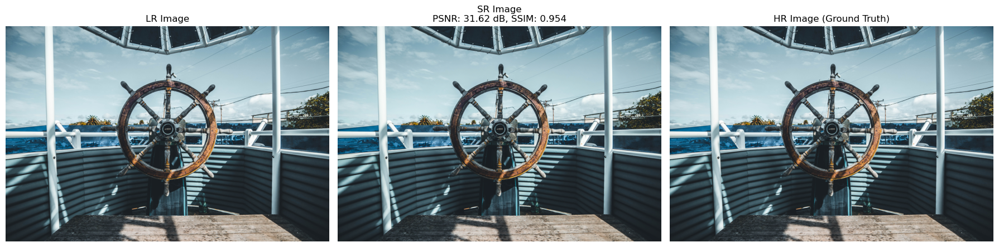

X2 SR on 2K Image downscaled by 8


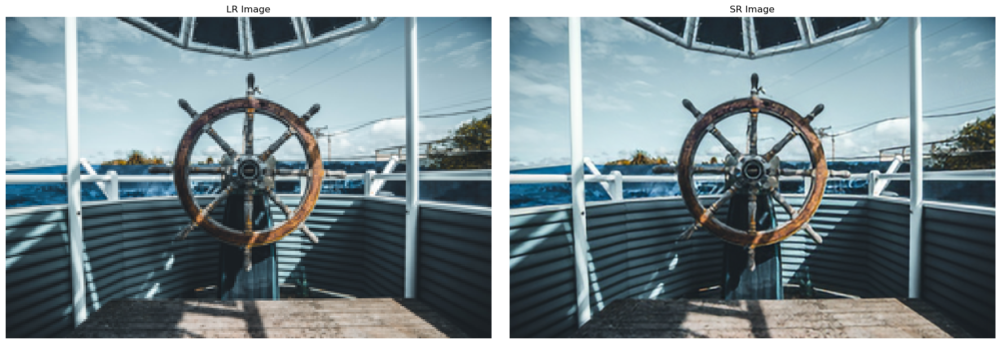

X2 SR on 2K Image downscaled by 4


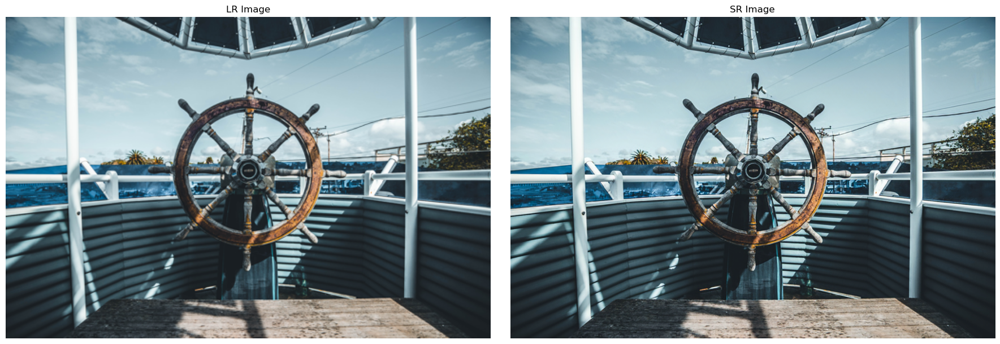

X2 SR on 2K Image downscaled by 2


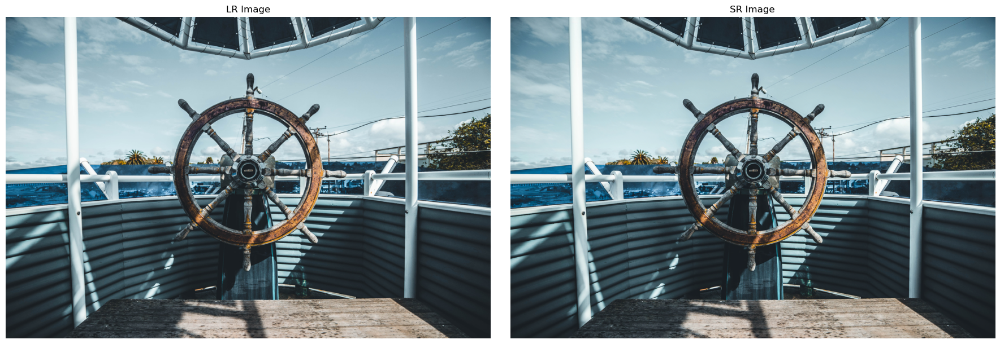

In [23]:
image = "0824.png"
scale = 2
# lr_image_path = "DIV2K_valid_LR_unknown/X4/0802x4.png"  # Path to one LR image
lr_image_path = f"DIV2K/DIV2K_valid_LR/X{scale}/{image}"
hr_image_path = f"DIV2K/DIV2K_valid_HR/{image}"          # Corresponding HR ground truth
model_path = "srgan_weights/generator(X2)_epoch_1000.pth"      # Path to your saved generator weights

device = 'cuda' if torch.cuda.is_available() else 'cpu'
infer_and_display(lr_image_path, hr_image_path, model_path, scale, device=device)

#image = "0900.png"
print("X2 SR on 2K Image downscaled by 8")
lr_image_path = f"DIV2K/DIV2K_valid_LR/X8/{image}"
infer(lr_image_path, model_path, scale, device=device)

print("X2 SR on 2K Image downscaled by 4")
lr_image_path = f"DIV2K/DIV2K_valid_LR/X4/{image}"
infer(lr_image_path, model_path, scale, device=device)

print("X2 SR on 2K Image downscaled by 2")
lr_image_path = f"DIV2K/DIV2K_valid_LR/X2/{image}"
infer(lr_image_path, model_path, scale, device=device)

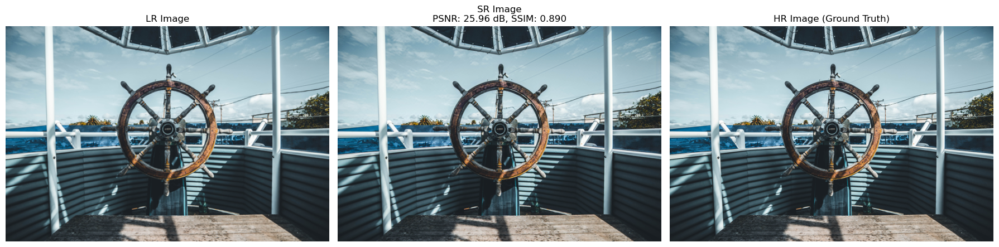

X4 SR on 2K Image downscaled by 8


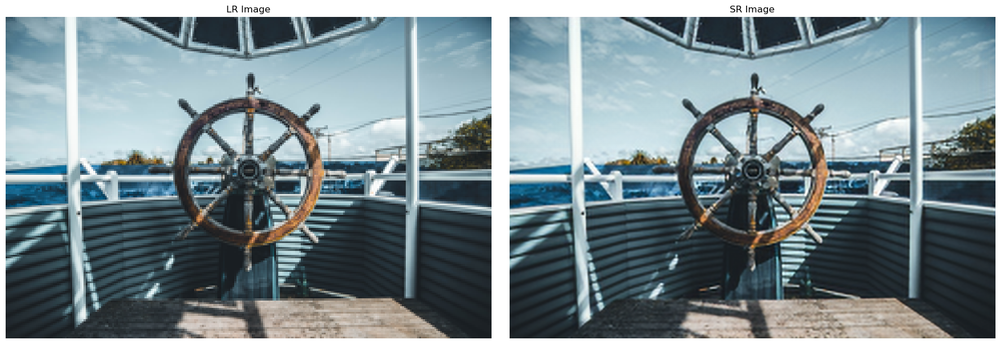

X4 SR on 2K Image downscaled by 4


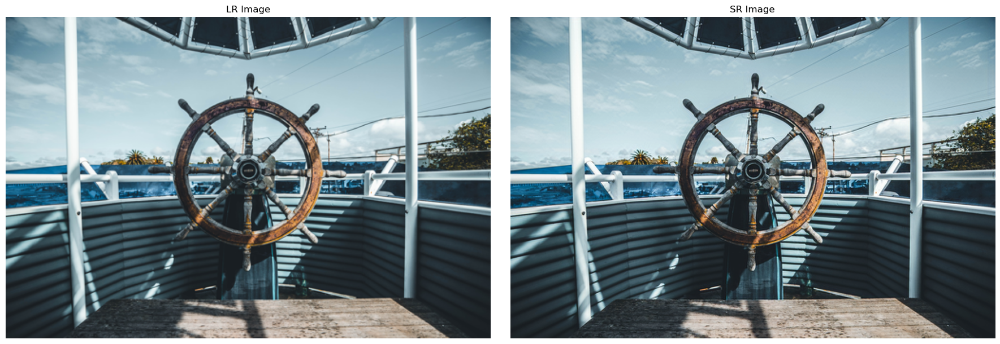

X4 SR on 2K Image downscaled by 2


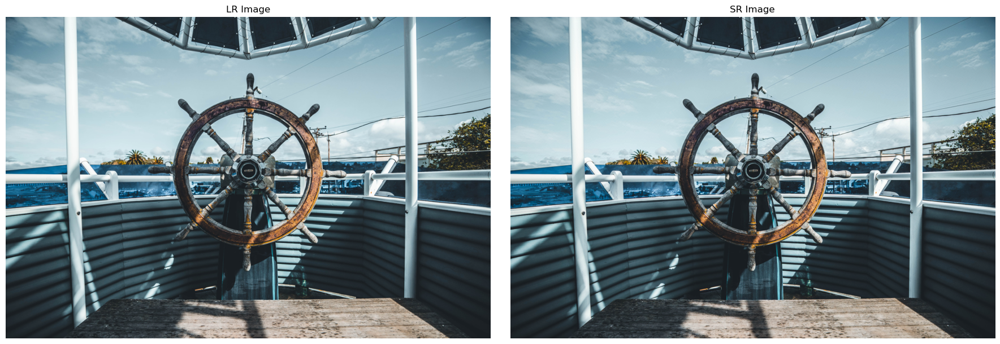

In [24]:
image = "0824.png"
scale = 4
lr_image_path = f"DIV2K/DIV2K_valid_LR/X{scale}/{image}"
hr_image_path = f"DIV2K/DIV2K_valid_HR/{image}"          # Corresponding HR ground truth
model_path = "srgan_weights/generator(X4)_epoch_1000.pth"      # Path to your saved generator weights

#lr_image_path = "DIV2K/DIV2K_train_LR/X4/0002.png"
#hr_image_path = "DIV2K/DIV2K_train_HR/0002.png"

device = 'cuda' if torch.cuda.is_available() else 'cpu'
infer_and_display(lr_image_path, hr_image_path, model_path, scale, device=device)

#image = "0830.png"
print("X4 SR on 2K Image downscaled by 8")
lr_image_path = f"DIV2K/DIV2K_valid_LR/X8/{image}"
infer(lr_image_path, model_path, scale, device=device)

print("X4 SR on 2K Image downscaled by 4")
lr_image_path = f"DIV2K/DIV2K_valid_LR/X4/{image}"
infer(lr_image_path, model_path, scale, device=device)

print("X4 SR on 2K Image downscaled by 2")
lr_image_path = f"DIV2K/DIV2K_valid_LR/X2/{image}"
infer(lr_image_path, model_path, scale, device=device)

Cropping HR image from (1356, 2040, 3) to match SR shape (1352, 2040, 3)


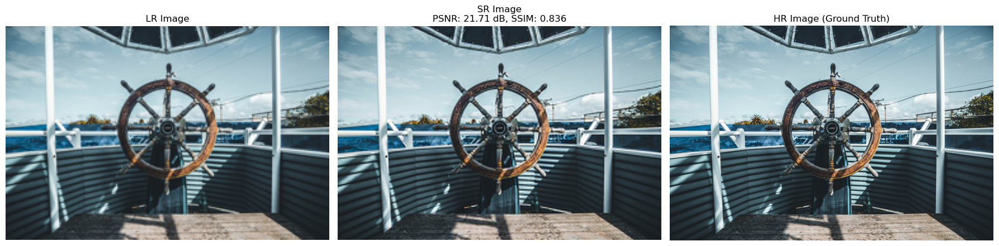

X8 SR on 2K Image downscaled by 8


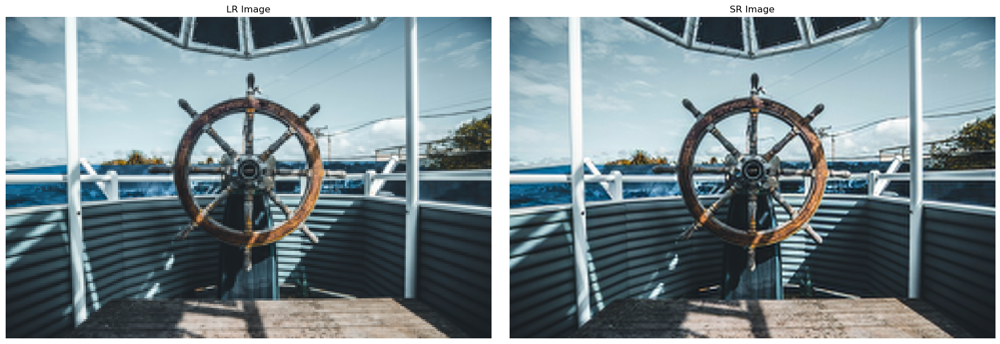

X8 SR on 2K Image downscaled by 4


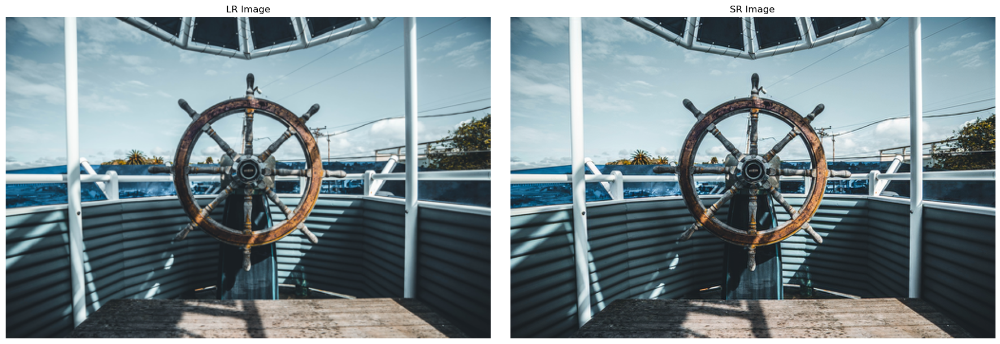

In [25]:
image = "0824.png"
scale = 8
lr_image_path = f"DIV2K/DIV2K_valid_LR/X{scale}/{image}"
hr_image_path = f"DIV2K/DIV2K_valid_HR/{image}"          # Corresponding HR ground truth
model_path = "srgan_weights/generator(X8)_epoch_1000.pth"      # Path to your saved generator weights


device = 'cuda' if torch.cuda.is_available() else 'cpu'
infer_and_display(lr_image_path, hr_image_path, model_path, scale, device=device)

#image = "0830.png"
print("X8 SR on 2K Image downscaled by 8")
lr_image_path = f"DIV2K/DIV2K_valid_LR/X8/{image}"
infer(lr_image_path, model_path, scale, device=device)

print("X8 SR on 2K Image downscaled by 4")
lr_image_path = f"DIV2K/DIV2K_valid_LR/X4/{image}"
infer(lr_image_path, model_path, scale, device=device)

#print("X8 SR on 2K Image downscaled by 2")
#lr_image_path = f"DIV2K/DIV2K_valid_LR/X2/{image}"
#infer(lr_image_path, model_path, scale, device='cpu') # may not be enough memory for X8 on 1K image, change device or comment out as needed

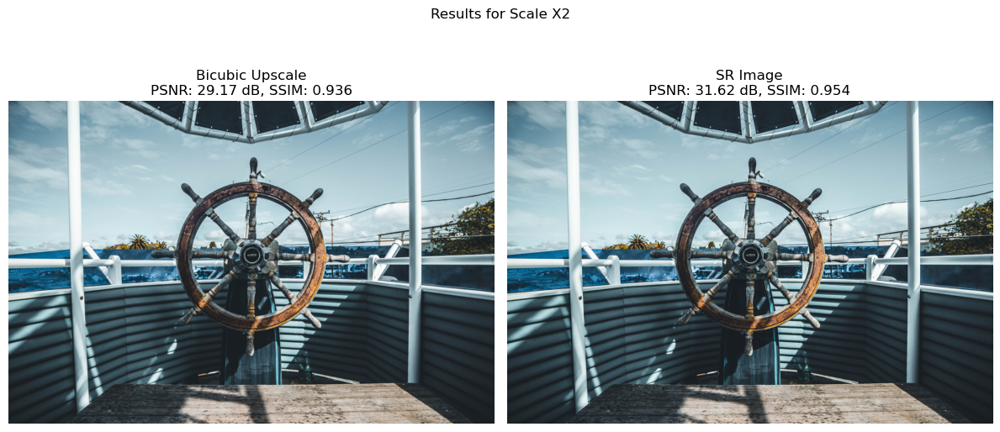

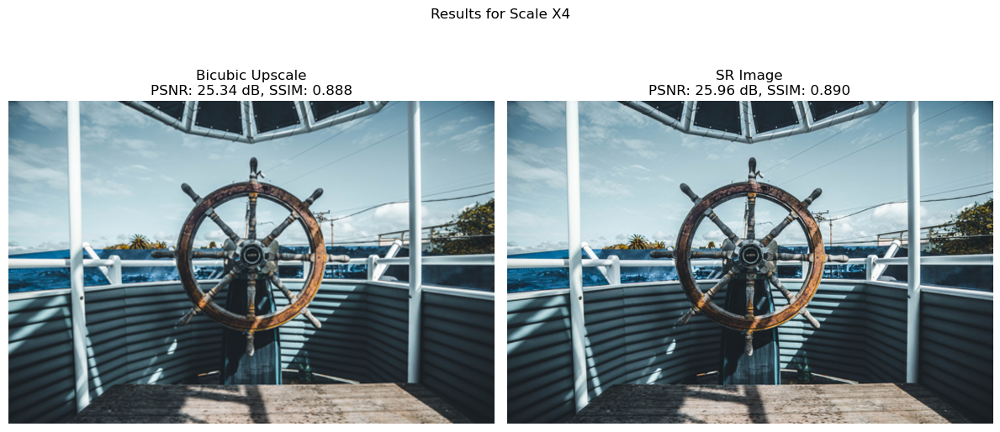

Cropping HR image from (1356, 2040, 3) to match SR shape (1352, 2040, 3) for PSNR and SSIM Calculation


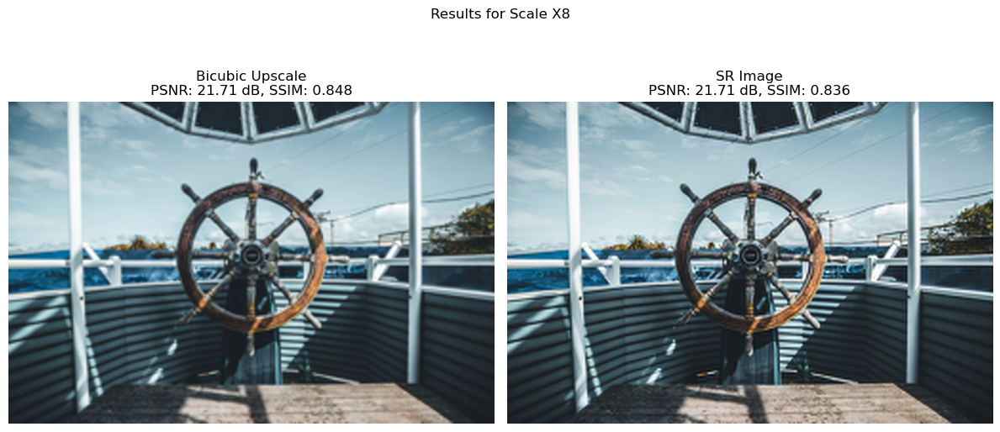

In [26]:
def display_bicubic_vs_sr(lr_image_path, bicubic_image_path, hr_image_path, model_path, scale, device='cuda'):
    """
    Loads a low-resolution image and its high-resolution ground truth,
    performs super-resolution using the pretrained generator, computes a bicubic
    upscale of the LR image, calculates PSNR and SSIM for both upscaled images (compared to HR),
    and displays the bicubic and SR images side-by-side with the computed metrics.
    """
    device = device if torch.cuda.is_available() else 'cpu'
    
    # Load the pretrained generator and set to evaluation mode
    generator = SRResNet(scale_factor=scale, n_residual_blocks=16).to(device)
    generator.load_state_dict(torch.load(model_path, map_location=device))
    generator.eval()
    
    # Define transforms for converting images to tensor and back
    to_tensor = transforms.ToTensor()  # Converts image to [0,1] tensor
    to_pil = transforms.ToPILImage()
    
    # Load LR and HR images with PIL
    lr_img_pil = Image.open(lr_image_path).convert("RGB")
    hr_img_pil = Image.open(hr_image_path).convert("RGB")
    bicubic_img_pil = Image.open(bicubic_image_path).convert("RGB")
    
    # Convert lr image to tensor (scale to [0,255])
    lr_tensor = to_tensor(lr_img_pil) * 255.0
    
    # Prepare LR tensor for SR inference (add batch dimension)
    lr_tensor = lr_tensor.unsqueeze(0).to(device)
    
    with torch.no_grad():
        sr_tensor = generator(lr_tensor)
        sr_tensor = torch.clamp(sr_tensor, 0, 255)
    
    # Convert outputs to PIL images for display (normalize to [0,1])
    bicubic_disp = bicubic_img_pil
    sr_disp = to_pil(sr_tensor.squeeze(0) / 255.0)
    hr_disp = hr_img_pil
    
    # Convert images to numpy arrays (uint8) for metric calculations
    bicubic_np = np.array(bicubic_disp)
    sr_np = np.array(sr_disp)
    hr_np = np.array(hr_disp)

    # If HR and SR shapes differ, crop the HR image to the SR image's shape for metric calculation
    if hr_np.shape[0] != sr_np.shape[0] or hr_np.shape[1] != sr_np.shape[1]:
        print(f"Cropping HR image from {hr_np.shape} to match SR shape {sr_np.shape} for PSNR and SSIM Calculation")
        hr_np = hr_np[:sr_np.shape[0], :sr_np.shape[1], :]
    
    # Compute PSNR and SSIM for bicubic and SR images relative to HR
    psnr_bicubic = peak_signal_noise_ratio(hr_np, bicubic_np, data_range=255)
    ssim_bicubic = structural_similarity(hr_np, bicubic_np, win_size=3, multichannel=True, data_range=255)
    
    psnr_sr = peak_signal_noise_ratio(hr_np, sr_np, data_range=255)
    ssim_sr = structural_similarity(hr_np, sr_np, win_size=3, multichannel=True, data_range=255)
    
    # Display the bicubic and SR images side-by-side with metrics
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))

    fig.suptitle(f"Results for Scale X{scale}")    
    
    axs[0].imshow(bicubic_disp)
    axs[0].set_title(f"Bicubic Upscale\nPSNR: {psnr_bicubic:.2f} dB, SSIM: {ssim_bicubic:.3f}")
    axs[0].axis("off")
    
    axs[1].imshow(sr_disp)
    axs[1].set_title(f"SR Image\nPSNR: {psnr_sr:.2f} dB, SSIM: {ssim_sr:.3f}")
    axs[1].axis("off")
    
    plt.tight_layout()
    plt.show()


image = "0824.png"
scales = [2, 4, 8]

for scale in scales:
    lr_image_path = f"DIV2K/DIV2K_valid_LR/X{scale}/{image}"
    bicubic_image_path = f"results/bicubic/X{scale}/{image}"
    hr_image_path = f"DIV2K/DIV2K_valid_HR/{image}"          # Corresponding HR ground truth
    model_path = f"srgan_weights/generator(X{scale})_epoch_1000.pth"      # Path to your saved generator weights
    
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    display_bicubic_vs_sr(lr_image_path, bicubic_image_path, hr_image_path, model_path, scale, device=device)

In [10]:
scales = [2, 4, 8]
for scale in scales:
    lr_images_dir = f"DIV2K/DIV2K_valid_LR/X{scale}/"           # Directory containing your low-resolution images
    hr_images_dir = "DIV2K/DIV2K_valid_HR/"
    output_dir = f"results/X{scale}/"                # Directory where super-resolved images will be saved
    model_path = f"srgan_weights/generator(X{scale})_epoch_1000.pth"      # Path to your saved generator weights
    
    test_model(model_path, lr_images_dir, hr_images_dir, output_dir, scale, device=device)

Saved results/X2/sr_0801.png.
Image 0801.png -> PSNR: 34.99, SSIM: 0.9404
Saved results/X2/sr_0802.png.
Image 0802.png -> PSNR: 39.03, SSIM: 0.9943
Saved results/X2/sr_0803.png.
Image 0803.png -> PSNR: 43.10, SSIM: 0.9983
Saved results/X2/sr_0804.png.
Image 0804.png -> PSNR: 31.71, SSIM: 0.9427
Saved results/X2/sr_0805.png.
Image 0805.png -> PSNR: 33.16, SSIM: 0.9233
Saved results/X2/sr_0806.png.
Image 0806.png -> PSNR: 32.54, SSIM: 0.9578
Saved results/X2/sr_0807.png.
Image 0807.png -> PSNR: 22.98, SSIM: 0.8501
Saved results/X2/sr_0808.png.
Image 0808.png -> PSNR: 30.09, SSIM: 0.9446
Saved results/X2/sr_0809.png.
Image 0809.png -> PSNR: 38.86, SSIM: 0.9835
Saved results/X2/sr_0810.png.
Image 0810.png -> PSNR: 32.27, SSIM: 0.9409
Saved results/X2/sr_0811.png.
Image 0811.png -> PSNR: 33.89, SSIM: 0.9461
Saved results/X2/sr_0812.png.
Image 0812.png -> PSNR: 32.41, SSIM: 0.9254
Saved results/X2/sr_0813.png.
Image 0813.png -> PSNR: 35.48, SSIM: 0.9478
Saved results/X2/sr_0814.png.
Image 08